In [68]:
import numpy as np
import numpy.polynomial.polynomial as poly

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from urllib.request import urlopen
import json

import itertools

from time import time
from datetime import datetime, timedelta
from pytz import timezone

import altair as alt
from altair import datum
alt.data_transformers.enable('data_server')
# from vega_datasets import data

DataTransformerRegistry.enable('data_server')

In [10]:
def optimize(df):
    '''
    Optimizes the data types in a pandas dataframe.
    '''
    dft = df.copy()
    # converts to datetime if possible
    dft = dft.apply(lambda col:
        pd.to_datetime(col, errors='ignore') if col.dtypes=='object' else col)
    
    # if there are less than half as many unique values as there are rows, convert to category
    for col in dft.select_dtypes(include='object'):
        if len(dft[col].unique()) / len(df[col]) < 0.5:
            dft[col] = dft[col].astype('category')
            
    # downcasts numeric columns if possible
    dft = dft.apply(lambda col: 
        pd.to_numeric(col, downcast='integer') if col.dtypes=='int64' else col)
    dft = dft.apply(lambda col: 
        pd.to_numeric(col, downcast='float') if col.dtypes=='float64' else col)
    
    return dft

In [22]:
df = optimize(pd.read_csv('data/df.csv'))

In [12]:
df['days'] = ((df['date'] - df['date'].min()) / np.timedelta64(1, 'D')).astype('int')

In [156]:
df.to_csv('data/df.csv', index=False)

In [23]:
la = timezone('US/Pacific')
last = df['date'].max()
df_slice = df[df['date'] == last]
df_slice.head()

,state,cluster,date,cases,deaths,county,total_pop,fips,white,black,...,delta_new_cases_per_100k,delta_new_deaths_per_100k,delta_new_cases_7sg,delta_new_deaths_7sg,delta_new_cases_per_100k_7sg,delta_new_deaths_per_100k_7sg,delta_new_cases_15sg,delta_new_deaths_15sg,delta_new_cases_per_100k_15sg,delta_new_deaths_per_100k_15sg
76156,Alabama,2,2020-07-28,11541,244,Autauga-Coffee-Elmore-Lee-Montgomery,580448.0,01001-01031-01051-01081-01101,322327.0,207550.0,...,-17.055792,-1.722807e-01,-36.571430,-2.500000,-6.300552,-0.430702,-20.991667,-1.141667,-3.616459,-0.196687
76157,Alabama,4,2020-07-28,10363,200,Baldwin-Mobile,636444.0,01003-01097,419294.0,167703.0,...,-4.870813,1.065814e-14,-56.428570,-1.178571,-8.866227,-0.185181,-20.833334,-0.808333,-3.273396,-0.127008
76158,Alabama,3,2020-07-28,6482,110,Barbour-Chambers-Covington-Crenshaw-Dale-Genev...,398366.0,01005-01017-01039-01041-01045-01061-01067-0106...,252360.0,116632.0,...,-20.584085,-7.530763e-01,-25.428572,-3.000000,-6.383218,-0.753076,-16.549999,-1.075000,-4.154471,-0.269852
76159,Alabama,5,2020-07-28,5676,146,Bibb-Butler-Chilton-Choctaw-Clarke-Conecuh-Esc...,261684.0,01007-01013-01021-01023-01025-01035-01053-0106...,156357.0,88687.0,...,-14.139191,-1.528561e+00,-25.321428,-1.321429,-9.676338,-0.504971,-10.750000,-0.616667,-4.108008,-0.235653
76160,Alabama,0,2020-07-28,22510,362,Blount-Calhoun-Cherokee-Clay-Cleburne-Colbert-...,1452779.0,01009-01015-01019-01027-01029-01033-01037-0104...,1161009.0,163021.0,...,-17.070732,-2.753344e-01,-88.178574,-5.250000,-6.069648,-0.361376,-33.816666,-2.700000,-2.327723,-0.185851


In [24]:
df_slice.columns

Index(['state', 'cluster', 'date', 'cases', 'deaths', 'county', 'total_pop',
       'fips', 'white', 'black', 'asian', 'hispanic', 'area', 'lon', 'lat',
       'votes_gop', 'votes_dem', 'total_votes', 'median_income', 'pop25',
       'no_hs', 'some_hs', 'hs', 'some_college', 'associates', 'bachelors',
       'graduate', 'pop_density', 'per_white', 'per_black', 'per_asian',
       'per_hispanic', 'per_total_votes', 'per_votes_gop', 'per_votes_dem',
       'per_no_hs', 'per_some_hs', 'per_hs', 'per_some_college',
       'per_associates', 'per_bachelors', 'per_graduate', 'per_4y', 'per_bhs',
       'gop', 'edu', 'per_gop', 'cases_per_100k', 'deaths_per_100k',
       'new_cases', 'new_deaths', 'new_cases_per_100k', 'new_deaths_per_100k',
       'new_cases_7sg', 'new_deaths_7sg', 'new_cases_per_100k_7sg',
       'new_deaths_per_100k_7sg', 'new_cases_15sg', 'new_deaths_15sg',
       'new_cases_per_100k_15sg', 'new_deaths_per_100k_15sg',
       'delta_new_cases', 'delta_new_deaths', 'delta_ne

In [15]:
def cov(x, y, w):
    return np.sum(w * (x - np.average(x, weights=w)) * (y - np.average(x, weights=w))) / np.sum(w)

def corr(x, y, w):
    return cov(x, y, w) / np.sqrt(cov(x, x, w) * cov(y, y, w))

x_cols = ['pop_density', 
          'per_white', 'per_black', 'per_asian', 'per_hispanic', 
          'per_total_votes', 'per_votes_gop', 
          'median_income', 
          'per_no_hs', 'per_some_hs', 'per_hs', 'per_some_college', 
          'per_associates', 'per_bachelors', 'per_graduate', 'per_4y', 'edu']
y_cols = x_cols + ['cases_per_100k', 'deaths_per_100k', 
                   'new_cases_per_100k_15sg', 'new_deaths_per_100k_15sg', 
                   'delta_new_cases_per_100k_15sg', 'delta_new_deaths_per_100k_15sg']
w_col = 'total_pop'

Text(0.5, 0.98, 'covid correlation heatmap')

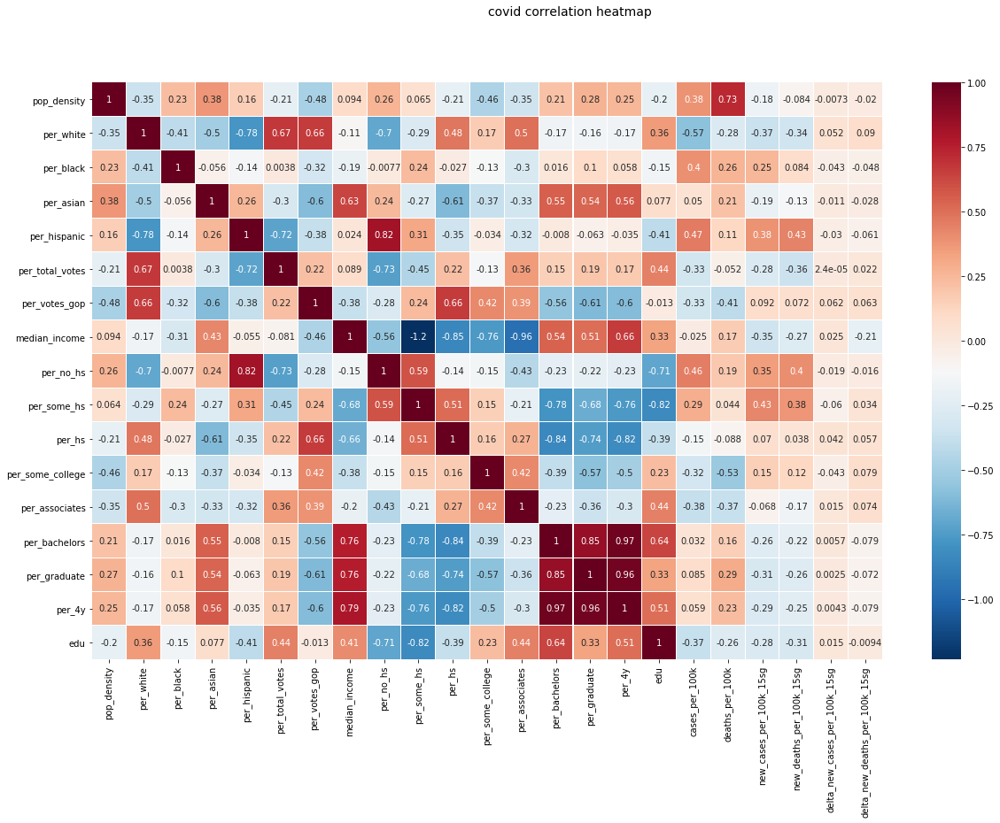

In [16]:
wcm = pd.DataFrame(index=x_cols, columns=y_cols)

for x in x_cols:
    for y in y_cols:
        wcm.loc[x, y] = corr(df_slice[x], df_slice[y], df_slice[w_col])
        
fig, (ax) = plt.subplots(1, 1, figsize=(20,12))

hm = sns.heatmap(np.array(wcm,dtype='float64'), 
                 ax=ax,
                 yticklabels=wcm.index,
                 xticklabels=wcm.columns,
                 cmap="RdBu_r",
                 annot=True, 
#                  fmt='.1f',
                 linewidths=.05)

# fig.subplots_adjust(top=0.93)
fig.suptitle('covid correlation heatmap', 
              fontsize=14)

## altair bubble chart helper function

In [25]:
def make_chart(df, params, line=True, split=False):
    
    smax = np.max(df[params['s_col']])
    smax = smax + (-smax) % 10
    
    base = alt.Chart(df).properties(
        title=params['chart_title'],
        width=720,
        height=480
    )
    
    circles = base.mark_circle(stroke='black', strokeWidth=0.25, opacity=0.5).encode(
        x=alt.X(
            params['x_col'] + ':Q',
            scale=alt.Scale(type=params['x_scale'], zero=False)
        ),
        y=alt.Y(
            params['y_col'] + ':Q',
            scale=alt.Scale(type=params['y_scale'], zero=False)
        ),
        size=alt.Size(
            params['s_col'] + ':Q',
            scale=alt.Scale(
                domain=[1,smax],
                range=[10,2000]
            ),
        ),
        color=alt.Color(
            params['c_col'] + ':Q',
            scale=alt.Scale(
                scheme=params['c_scheme'],
                domain=[np.percentile(df[params['c_col']], 0.5), 
                        np.percentile(df[params['c_col']], 99.5)],
                domainMid=params['c_mid'],
            ),
            sort=params['c_sort'],
        ),
        tooltip=[
            'state:N', 'county:N',
            alt.Tooltip(
                params['c_col'] + ':Q',
                format='.2f',
            ),
            alt.Tooltip(
                params['s_col'] + ':Q',
                format='.2f',
            ),
            alt.Tooltip(
                params['y_col'] + ':Q',
                format='.2f',
            ),
            alt.Tooltip(
                params['x_col'] + ':Q',
                format='.2f',
            )
        ]
    )
    
    if line:
        if split:
            pfit0 = poly.polyfit(
                df[df['gop']==0][params['x_col']], 
                df[df['gop']==0][params['y_col']], 
                1, 
                w=df[df['gop']==0][params['w_col']])
            fit0 = poly.polyval(np.unique(df[df['gop']==0][params['x_col']]), pfit0)
            line_df0 = pd.DataFrame({
              'x': np.unique(df[df['gop']==0][params['x_col']]),
              'y': fit0
            })
            line0 = alt.Chart(line_df0).mark_line(color='darkblue').encode(
                x='x:Q',
                y='y:Q'
            ).transform_calculate()
            
            pfit1 = poly.polyfit(
                df[df['gop']==1][params['x_col']], 
                df[df['gop']==1][params['y_col']], 
                1, 
                w=df[df['gop']==1][params['w_col']])
            fit1 = poly.polyval(np.unique(df[df['gop']==1][params['x_col']]), pfit1)
            line_df1 = pd.DataFrame({
              'x': np.unique(df[df['gop']==1][params['x_col']]),
              'y': fit1
            })
            line1 = alt.Chart(line_df1).mark_line(color='firebrick').encode(
                x='x:Q',
                y='y:Q'
            ).transform_calculate()
            return circles + line0 + line1
        else:
            pfit = poly.polyfit(
                df[params['x_col']], 
                df[params['y_col']], 
                1, 
                w=df[params['w_col']])
            fit = poly.polyval(np.unique(df[params['x_col']]), pfit)
            line_df = pd.DataFrame({
              'x': np.unique(df[params['x_col']]),
              'y': fit
            })
            line = alt.Chart(line_df).mark_line(color='black').encode(
                x='x:Q',
                y='y:Q'
            ).transform_calculate()
            return circles + line
        
        
#     if line:
#         points_invis = base.mark_point(opacity=0).encode(
#             x=alt.X(
#                 params['x_col'] + ':Q',
#                 scale=alt.Scale(type=params['x_scale'], zero=False)
#             ),
#             y=alt.Y(
#                 params['y_col'] + ':Q',
#                 scale=alt.Scale(type=params['y_scale'], zero=False)
#             ),
#         )
#         if split:
#             line0 = points_invis.transform_filter(
#                 (datum.gop == 0)
#             ).transform_regression(
#                 params['x_col'],
#                 params['y_col'],
#                 method='linear'
#             ).mark_line(color='darkblue')
#             line1 = points_invis.transform_filter(
#                 (datum.gop == 1)
#             ).transform_regression(
#                 params['x_col'],
#                 params['y_col'],
#                 method='linear'
#             ).mark_line(color='firebrick')
#             return circles + line0 + line1
#         else:
#             line = points_invis.transform_regression(
#                 params['x_col'],
#                 params['y_col'],
#                 method='linear'
#             ).mark_line(color='black')
#             return circles + line
    else:
        return circles

# Case Density vs. Population Density (Δ new cases)

In [26]:
params = dict(
    chart_title='Case Density vs. Population Density',
    x_col='pop_density',
    x_scale='sqrt',
    y_col='cases_per_100k',
    y_scale='sqrt',
    s_col='cases',
    c_col='new_cases_per_100k_15sg',
    c_scheme='blueorange',
    c_mid=df_slice['new_cases_per_100k_15sg'].median(),
    c_sort='ascending',
    w_col='total_pop'
)

make_chart(df_slice, params)

alt.LayerChart(...)

# Case Density vs. Median Income (Δ new cases)

In [27]:
params = dict(
    chart_title='Case Density vs. Median Income',
    x_col='median_income',
    x_scale='linear',
    y_col='cases_per_100k',
    y_scale='sqrt',
    s_col='cases',
    c_col='new_cases_per_100k_15sg',
    c_scheme='blueorange',
    c_mid=df_slice['new_cases_per_100k_15sg'].median(),
    c_sort='ascending',
    w_col='total_pop'
)

make_chart(df_slice, params)

alt.LayerChart(...)

# Case Density vs. Educational Attainment

In [28]:
params = dict(
    chart_title='Case Density vs. Educational Attainment',
    x_col='edu',
    x_scale='linear',
    y_col='cases_per_100k',
    y_scale='sqrt',
    s_col='cases',
    c_col='new_cases_per_100k_15sg',
    c_scheme='blueorange',
    c_mid=df_slice['new_cases_per_100k_15sg'].median(),
    c_sort='ascending',
    w_col='total_pop'
)

make_chart(df_slice, params)

alt.LayerChart(...)

In [29]:
params = dict(
    chart_title='New Cases vs. Percent GOP',
    x_col='per_gop',
    x_scale='linear',
    y_col='new_cases_per_100k_15sg',
    y_scale='linear',
    s_col='cases',
    c_col='per_gop',
    c_scheme='redblue',
    c_mid=0.5,
    c_sort='descending',
    w_col='total_pop'
)

make_chart(df_slice, params)

alt.LayerChart(...)

In [30]:
params = dict(
    chart_title='New Cases vs. Percent GOP',
    x_col='per_gop',
    x_scale='linear',
    y_col='new_cases_per_100k_15sg',
    y_scale='linear',
    s_col='cases',
    c_col='per_gop',
    c_scheme='redblue',
    c_mid=0.5,
    c_sort='descending',
    w_col='total_pop'
)

make_chart(df_slice, params, split=True)

alt.LayerChart(...)

In [31]:
params = dict(
    chart_title='Change in New Cases vs. New Cases',
    x_col='per_gop',
    x_scale='linear',
    y_col='delta_new_cases_per_100k_15sg',
    y_scale='linear',
    s_col='cases',
    c_col='per_gop',
    c_scheme='redblue',
    c_mid=0.5,
    c_sort='descending',
    w_col='total_pop'
)

make_chart(df_slice, params)

alt.LayerChart(...)

In [32]:
params = dict(
    chart_title='Change in New Cases vs. New Cases',
    x_col='per_gop',
    x_scale='linear',
    y_col='delta_new_cases_per_100k_15sg',
    y_scale='linear',
    s_col='cases',
    c_col='per_gop',
    c_scheme='redblue',
    c_mid=0.5,
    c_sort='descending',
    w_col='total_pop'
)

make_chart(df_slice, params, split=True)

alt.LayerChart(...)

In [33]:
params = dict(
    chart_title='Cases per 100k vs. New Cases',
    x_col='cases_per_100k',
    x_scale='linear',
    y_col='new_cases_per_100k_15sg',
    y_scale='linear',
    s_col='cases',
    c_col='per_gop',
    c_scheme='redblue',
    c_mid=0.5,
    c_sort='descending',
    w_col='total_pop'
)

make_chart(df_slice, params, split=True)

alt.LayerChart(...)

In [34]:
params = dict(
    chart_title='New Cases vs. Percent GOP',
    x_col='per_gop',
    x_scale='linear',
    y_col='edu',
    y_scale='linear',
    s_col='cases',
    c_col='new_cases_per_100k_15sg',
    c_scheme='lightmulti',
    c_mid=df_slice['new_cases_per_100k_15sg'].median(),
    c_sort='ascending',
    w_col='total_pop'
)

make_chart(df_slice, params)

alt.LayerChart(...)

In [53]:
points0 = alt.Chart(df).mark_area().transform_filter(
    (datum.gop == 0)
).encode(
    alt.X('date:T', title='Date'),
    alt.Y('new_cases:Q'),
    color=alt.Color(
        'per_gop' + ':Q',
        scale=alt.Scale(
            scheme='redblue',
            domain=[np.percentile(df['per_gop'].unique(), 0.5), 
                    np.percentile(df['per_gop'].unique(), 99.5)],
            domainMid=0.5,
        ),
        sort='descending',
    ),
#     size=alt.Size('new_cases', scale=alt.Scale(range=[5,250]))
)

points1 = alt.Chart(df).mark_area().transform_filter(
    (datum.gop == 1)
).transform_calculate(
    negative='datum.new_cases * -1'
).encode(
    alt.X('date:T', title='Date'),
    alt.Y('negative:Q'),
    color=alt.Color(
        'per_gop' + ':Q',
        scale=alt.Scale(
            scheme='redblue',
            domain=[np.percentile(df['per_gop'].unique(), 0.5), 
                    np.percentile(df['per_gop'].unique(), 99.5)],
            domainMid=0.5,
        ),
        sort='descending',
    ),
    order=alt.Order('per_gop', sort='ascending')
#     size=alt.Size('new_cases', scale=alt.Scale(range=[5,250]))
)

points0 + points1

alt.LayerChart(...)

In [67]:
points0 = alt.Chart(df).mark_area().transform_filter(
    (datum.gop == 0)
).encode(
    alt.X('date:T', title='Date'),
    alt.Y('new_deaths:Q'),
    color=alt.Color(
        'per_gop' + ':Q',
        scale=alt.Scale(
            scheme='redblue',
            domain=[np.percentile(df['per_gop'].unique(), 0.5), 
                    np.percentile(df['per_gop'].unique(), 99.5)],
            domainMid=0.5,
        ),
        sort='descending',
    ),
#     size=alt.Size('new_cases', scale=alt.Scale(range=[5,250]))
)

points1 = alt.Chart(df).mark_area().transform_filter(
    (datum.gop == 1)
).transform_calculate(
    negative='datum.new_deaths * -1'
).encode(
    alt.X('date:T', title='Date'),
    alt.Y('negative:Q'),
    color=alt.Color(
        'per_gop' + ':Q',
        scale=alt.Scale(
            scheme='redblue',
            domain=[np.percentile(df['per_gop'].unique(), 0.5), 
                    np.percentile(df['per_gop'].unique(), 99.5)],
            domainMid=0.5,
        ),
        sort='descending',
    ),
    order=alt.Order('per_gop', sort='ascending')
#     size=alt.Size('new_cases', scale=alt.Scale(range=[5,250]))
)

points0 + points1

alt.LayerChart(...)

In [74]:
points0 = alt.Chart(df).mark_area().transform_filter(
    (datum.median_income > 61937)
).encode(
    alt.X('date:T', title='Date'),
    alt.Y('new_cases:Q'),
    color=alt.Color(
        'median_income' + ':Q',
        scale=alt.Scale(
            scheme='lightmulti',
            domain=[np.percentile(df['median_income'].unique(), 0.5), 
                    np.percentile(df['median_income'].unique(), 99.5)],
            domainMid=61937,
        ),
        sort='ascending',
    ),
    order=alt.Order('median_income', sort='ascending')
#     size=alt.Size('new_cases', scale=alt.Scale(range=[5,250]))
)

points1 = alt.Chart(df).mark_area().transform_filter(
    (datum.median_income <= 61937)
).transform_calculate(
    negative='datum.new_cases * -1'
).encode(
    alt.X('date:T', title='Date'),
    alt.Y('negative:Q'),
    color=alt.Color(
        'median_income' + ':Q',
        scale=alt.Scale(
            scheme='lightmulti',
            domain=[np.percentile(df['median_income'].unique(), 0.5), 
                    np.percentile(df['median_income'].unique(), 99.5)],
            domainMid=61937,
        ),
        sort='ascending',
    ),
    order=alt.Order('median_income', sort='descending')
#     size=alt.Size('new_cases', scale=alt.Scale(range=[5,250]))
)

points0 + points1

alt.LayerChart(...)